### Illustrative Example of ARBO 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.optimize import minimize 

In [2]:
def f(zo):
    xf=zo[0];tf=zo[1]
    return - (-np.sin(tf*xf) - np.sqrt(tf)*xf**2 + 0.5*xf )#+ noise * np.random.randn(*X.shape)

In [3]:
#Very small noise for numerical stability
noise=1e-5
def visualize_1D(theta):
    nvis=1000 #Number of x points to plot
    Z_vis=np.zeros((nvis,2))
    Z_vis[:,0]=np.random.uniform(-1.0,2,nvis)
    Z_vis[:,0]=np.sort(Z_vis[:,0])
    Z_vis[:,1]=np.random.uniform(theta,theta,nvis)
    Y_vis=np.zeros((nvis,1))
    for k in range(nvis): 
        Y_vis[k]=f(Z_vis[k,:])

    #Z_init_nom = Z_init[:,0]
    plt.plot(Z_vis[:,0],Y_vis,'-',label='Theta is %s ' % theta)
    plt.legend()
    return 


In [4]:
from scipy.optimize import minimize

In [5]:
import pybobyqa

Here we visualize the need for robust BO against an adversary. Clearly the optimum design point $x$ changes depending the uncertain parameter $\theta$, so we should identify a region for which the decision variable $x$ resides in an optimal region

In [6]:
thetas=np.linspace(2.0,4.0,10)
plt.figure()
for j in range(len(thetas)):
    visualize_1D(thetas[j])


In [7]:
#Contour Plot
npoints = 1000
xplt = np.linspace(-1.0, 2.0, npoints)
tplt = np.linspace(2.0, 4.0, npoints)
Xm, Tm = np.meshgrid(xplt, tplt)
Z = - (-np.sin(Tm*Xm) - np.sqrt(Tm)*Xm**2 + 0.5*Xm )

Since this is an easy function, let's optimize for various values of the uncertainty and observe the optimum location

In [8]:
def optimize(bounds,thetav):
    def toy_f(xv):
        fval = - (-np.sin(thetav*xv) - np.sqrt(thetav)*xv**2 + 0.5*xv )#+ noise * np.random.randn(*X.shape)
        return fval
        
    x0=0.0
    bounds_c = np.array([[bounds[0], bounds[1]]])
    res = minimize(toy_f, x0=x0, bounds=bounds_c,method='L-BFGS-B',options={'gtol': 1e-6, 'disp': False})   
    return res

In [9]:
bounds=np.array((-1.0,2.0))
theta_arr = np.linspace(2.0,4.0,10)
for j in range(10):
    opt = optimize(bounds,theta_arr[j])
    print('For theta',theta_arr[j],'the optimal point is',opt.x,'with a value', opt.fun)

For theta 2.0 the optimal point is [-0.35732089] with a value -0.2961221720132362
For theta 2.2222222222222223 the optimal point is [-0.35614766] with a value -0.3442080807784783
For theta 2.4444444444444446 the optimal point is [-0.35112967] with a value -0.3884149334287279
For theta 2.6666666666666665 the optimal point is [-0.34373886] with a value -0.42874169776338356
For theta 2.888888888888889 the optimal point is [-0.33496089] with a value -0.46538164266451343
For theta 3.111111111111111 the optimal point is [-0.32544808] with a value -0.4986184678439288
For theta 3.333333333333333 the optimal point is [-0.3156283] with a value -0.5287666139040437
For theta 3.5555555555555554 the optimal point is [-0.30577922] with a value -0.5561388009875323
For theta 3.7777777777777777 the optimal point is [-0.29607851] with a value -0.58102963142355
For theta 4.0 the optimal point is [-0.28663676] with a value -0.6037083664967762


We clearly see a trend that is described in the results as well as in the plots. As $\theta$ increases, the minimum value is lower. So, in the worst case scenario, the lowest optimal value corresponds to $\theta=2$. This gives us some intuition of what the ARBO algorithm should yield. 

In [10]:
def theta_optimize(bounds,xv):
    def toy_f_theta(thetav):
        fval = (-np.sin(thetav*xv) - np.sqrt(thetav)*xv**2 + 0.5*xv )#+ noise * np.random.randn(*X.shape)
        return fval
        
    x0=3.0 #Initial guess for theta 
    bounds_c = np.array([[bounds[0], bounds[1]]])
    res = minimize(toy_f_theta, x0=x0, bounds=bounds_c,method='L-BFGS-B',options={'gtol': 1e-7, 'disp': False})   
    return res

In [11]:
bounds_theta=np.array((2.0,4.0))
x_arr = np.linspace(-1.0,2.0,700)
function_values_plot = x_arr*0.0
for j in range(700):
    theta_opti_plot = theta_optimize(bounds_theta,x_arr[j])
    print('For x',x_arr[j],'the optimal theta is',theta_opti_plot.x,'with a value', theta_opti_plot.fun)
    function_values_plot[j]=-theta_opti_plot.fun

For x -1.0 the optimal theta is [4.] with a value -3.2568024953079284
For x -0.9957081545064378 the optimal theta is [4.] with a value -3.2261937126308764
For x -0.9914163090128756 the optimal theta is [4.] with a value -3.195438910872546
For x -0.9871244635193133 the optimal theta is [4.] with a value -3.1645414945481645
For x -0.9828326180257511 the optimal theta is [4.] with a value -3.1335049319174404
For x -0.9785407725321889 the optimal theta is [4.] with a value -3.1023327539624246
For x -0.9742489270386266 the optimal theta is [4.] with a value -3.0710285533468884
For x -0.9699570815450643 the optimal theta is [4.] with a value -3.039595983357525
For x -0.9656652360515021 the optimal theta is [4.] with a value -3.008038756827283
For x -0.9613733905579399 the optimal theta is [4.] with a value -2.976360645041147
For x -0.9570815450643777 the optimal theta is [4.] with a value -2.9445654766247005
For x -0.9527896995708155 the optimal theta is [4.] with a value -2.912657136415781


### Solving the Original Problem
This toy problem is cheap to evaluate so we can try out and solve the original nested optimization problem \
$min_{x \in \mathcal{X}} max_{\theta \in \mathcal{\Theta}} f(x,\theta)$

In [12]:
def theta_locate(xi,bounds):
    # Minimization objective is the negative acquisition function
    def f_theta_obj(ti):
        fval = - (-np.sin(ti*xi) - np.sqrt(ti)*xi**2 + 0.5*xi )#+ noise * np.random.randn(*X.shape)
        return -fval #It is a Max problem  

    bounds_c = np.array([[bounds[0], bounds[1]]])
    #Find the best optimum by starting from n_restart different random points.
    min_val=np.inf
    n_restarts=25 #Random initializations 
    for x0 in np.linspace(bounds_c[:, 0], bounds_c[:, 1], n_restarts):
        res = minimize(f_theta_obj, x0=x0, bounds=bounds_c,method='L-BFGS-B',options={'gtol': 1e-7, 'disp': False})  
        if res.fun < min_val:
            res_best = res
            min_val = res.fun[0]
            min_x = res.x  
    return res_best

In [15]:
def original_outer_problem(theta_bounds,x_bounds):

    def MinMax(x):
        inner_theta = theta_locate(x,theta_bounds)
        opti_theta = inner_theta.x[0]
        return -inner_theta.fun[0] #whatever is returned is to be minimized
    
    best_min = np.inf
    n_trials = 5
    #bounds_xc = np.array([[x_bounds[0], x_bounds[1]]])
    x0 = np.linspace(-0.95,1.85,n_trials)
    #x0tr = np.array([0.0])
    for i in range(n_trials):
        x0tr=[x0[i]]
        soln = minimize(MinMax, x0tr, bounds=x_bounds,method='COBYQA')
        if soln.f<best_min:
            sol_best = soln
            best_min = sol_best.f
    #     print(soln.msg)
    #soln_best = pybobyqa.solve(MinMax, x0tr, bounds=([x_bounds[0]],[x_bounds[1]]),seek_global_minimum=False)

    return sol_best

In [16]:
bounds_th =np.array((2.0,4.0));bounds_x =np.array((-1.0,2.0))
opti_full = original_outer_problem(bounds_th,bounds_x)

ValueError: not enough values to unpack (expected 2, got 1)

In [15]:
inner_theta = theta_locate(opti_full.x,bounds_th)
opti_theta = inner_theta.x[0]
print('The optimal x is found as', opti_full.x, 'whose optimal (worst-case) theta is', opti_theta)

The optimal x is found as [-0.35732089] whose optimal (worst-case) theta is 2.0


(-1.0, 0.5)

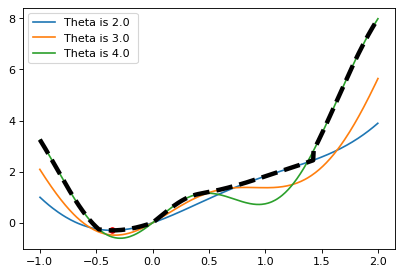

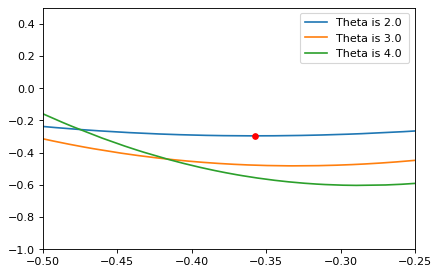

In [16]:
thetas_plt=np.linspace(2.0,4.0,3)
plt.figure(dpi=80)
for j in range(len(thetas_plt)):
    visualize_1D(thetas_plt[j])
plt.plot(opti_full.x,opti_full.f,'ro',markersize=5)
plt.plot(x_arr,function_values_plot,'k--',linewidth=4)


thetas_plt=np.linspace(2.0,4.0,3)
plt.figure(dpi=80)
for j in range(len(thetas_plt)):
    visualize_1D(thetas_plt[j])
plt.plot(opti_full.x,opti_full.f,'ro',markersize=5)
plt.xlim(-0.5,-0.25)
plt.ylim(-1.0,0.5)

Intuitively this looks correct. In the region where we see that the function has the lowest values, regardless of theta, we located the worst-case, i.e., the highest minimum. 

### Custom Bayesian Optimization Loop

Here we define the functions necessary to solve the optimization problem using ARBO

### Define Acquisition Functions and Optimizers

In [17]:
def upper_confidence_bound(theta,x,beta,gpr):
    xt = x
    zt=np.zeros((1,2))
    zt[0,0] = xt; zt[0,1] = theta;
    mu, variance  = gpr.predict(zt)
    sigma = np.sqrt(variance)
    ucb_theta = mu + sigma*beta**(1/2)
    return ucb_theta[0]

In [18]:
def lower_confidence_bound(theta,x,beta,gpr):
    xt = x
    zt=np.zeros((1,2))
    zt[0,0] = xt; zt[0,1] = theta;
    mu, variance  = gpr.predict(zt)
    sigma = np.sqrt(variance)
    lcb_theta = mu - sigma*beta**(1/2)
    #print(ucb_theta)
    return lcb_theta[0]

In [19]:
def plot_current_gp(theta,beta,gpr):
    xp=np.linspace(-1,2,100)
    plus_std = 0.0*xp
    minus_std = 0.0*xp
    mean=0.0*xp
    for i in range(len(xp)):
        xt = xp[i]
        zt=np.zeros((1,2))
        zt[0,0] = xt; zt[0,1] = theta;
        mu, variance  = gpr.predict(zt)
        sigma = np.sqrt(variance)
        plus_std[i]=mu+sigma
        minus_std[i]=mu-sigma
        mean[i]=mu
    plt.plot(xp,mean)
    plt.fill_between(xp, minus_std, plus_std, alpha=0.2)

    return

In [20]:
def inner_theta_propose(x,beta,gpr,bounds):
    # Minimization objective is the negative acquisition function
    def lcb_theta_obj(t):
        return -lower_confidence_bound(t, x, beta, gpr) #minus to solve for max
    
    bounds_c = np.array([[bounds[0], bounds[1]]])
    # Find the best optimum by starting from n_restart different random points.
    
    min_val=np.inf
    n_restarts=5
    
    for x0 in np.linspace(bounds_c[:, 0], bounds_c[:, 1], n_restarts):
        inn_res = minimize(lcb_theta_obj, x0=x0, bounds=bounds_c,method='L-BFGS-B',options={'gtol': 1e-7, 'disp': False})  
      #  res = minimize(min_obj, x0=x0, bounds=bounds, method='L-BFGS-B')        
        if inn_res.fun < min_val:
            inn_res_best = inn_res
            min_val = inn_res.fun[0]
            min_x = inn_res.x  
    return inn_res_best
   

In [21]:
def outer_x_propose(beta,gpr,theta_bounds,x_bounds):
 
    def MinMaxCB(x):
        inner_theta = inner_theta_propose(x,beta,gpr,theta_bounds)
        opti_theta = inner_theta.x[0]
        return -inner_theta.fun[0] #Remark: whatever is returned is to be minimized, but it needs a minimum sign 
        #since in the inner problem we solve max lcb ==> min-lcb but the optimal will have a "-" in front of it.
    """
    best_min = np.inf
    n_restarts = 5
    x0 = np.random.uniform(x_bounds[0],x_bounds[1],n_restarts)
    for i in range(n_restarts):
        x0tr=[x0[i]]
        soln = pybobyqa.solve(MinMaxCB, x0tr, bounds=([x_bounds[0]],[x_bounds[1]]))
        if soln.f<best_min:
            sol_best = soln
            best_min = sol_best.f
    """
    x0tr = np.random.uniform(x_bounds[0],x_bounds[1],1)
    sol_best = pybobyqa.solve(MinMaxCB, x0tr, bounds=([x_bounds[0]],[x_bounds[1]]), seek_global_minimum=True)
    return sol_best

In [22]:
def joint_location_propose(beta, gpr, theta_bounds,x_bounds):
    #1. Find the design point proposed by the maxmin problem 
    opti_x = outer_x_propose(beta,gpr,theta_bounds,x_bounds)
    xto = opti_x.x
    
    #2. Define the lower-confidence bound problem for theta
    def ucb_theta_obj(theta):
        return -upper_confidence_bound(theta, xto, beta, gpr) #max the ucb
    
    bounds_c = np.array([[theta_bounds[0], theta_bounds[1]]])
    
    min_val=np.inf
    
    n_restarts=5
     
    # Find the best optimum by starting from n_restart different random points.
    for x0 in np.linspace(bounds_c[:, 0], bounds_c[:, 1], n_restarts):
    #for i in range(len(th0))  :
        unc_res = minimize(ucb_theta_obj, x0=x0, bounds=bounds_c,method='L-BFGS-B',options={'gtol': 1e-7, 'disp': False})   
      #  res = minimize(min_obj, x0=x0, bounds=bounds, method='L-BFGS-B')        
        if unc_res.fun < min_val:
            unc_res_best = unc_res
            min_val = unc_res.fun[0]
            min_x = unc_res.x  
    tho = unc_res_best.x
    
    #Once we have the optimal theta at this iteration look for the GP
   
    return xto,tho

### Recommendation functions
There are various ways to recommend the best point. Here we follow the algorithm in the paper, i.e., out of the best decision variables explored (discrete set of points now) we optimize for the best smallest highest UCB

In [23]:
def inner_theta_propose_recommend(x,beta,gpr,bounds):
    # Minimization objective is the negative acquisition function
    def upper_theta_obj_recommend(t):
        return -upper_confidence_bound(t, x, beta, gpr) #minus to solve for max
    
    bounds_c = np.array([[bounds[0], bounds[1]]])
     # Find the best optimum by starting from n_restart different random points.
    min_val=np.inf
    
    n_restarts=5
     
    for x0 in np.linspace(bounds_c[:, 0], bounds_c[:, 1], n_restarts):
    #for i in range(len(th0))  :
        res = minimize(upper_theta_obj_recommend, x0=x0, bounds=bounds_c,method='L-BFGS-B',options={'gtol': 1e-7, 'disp': False})  
      #  res = minimize(min_obj, x0=x0, bounds=bounds, method='L-BFGS-B')        
        if res.fun < min_val:
            res_best = res
            min_val = res.fun[0]
            min_x = res.x  
    return res_best

In [24]:
def recommend_optimum(zt_seq,beta,theta_bounds,current_gp):
    ucb_val = np.zeros((len(zt_seq),1))
    opti_theta = np.zeros((len(zt_seq),1))
    for j in range(len(zt_seq)):
        xt_cand = zt_seq[j].flatten()[0] #th_cand is redundant
        inner_theta = inner_theta_propose(xt_cand,beta,current_gp,theta_bounds)
        opti_theta[j] = inner_theta.x[0]
        ucb_val[j] = upper_confidence_bound(opti_theta[j],xt_cand,beta,current_gp)
    
    #print(lcb_val)
    if len(ucb_val)>1:
        opt_index = np.argmin(ucb_val)
        #print(opt_index)
        xopt = zt_seq[opt_index].flatten()[0]
        sucb_opt = ucb_val[opt_index] 
        #plot_current_gp(opti_theta[opt_index],beta,current_gp)
        #visualize_1D(opti_theta[opt_index])
    else:
        xopt = zt_seq[0].flatten()[0]
        sucb_opt = ucb_val[0]
    return xopt, sucb_opt

In [25]:
def recommend_optimum_modified(zt_seq,beta,theta_bounds,current_gp):
    '''
    Same as previous, returns the optimal theta as well
    '''
    ucb_val = np.zeros((len(zt_seq),1))
    opti_theta = np.zeros((len(zt_seq),1))
    for j in range(len(zt_seq)):
        xt_cand = zt_seq[j].flatten()[0] #th_cand is redundant
        #inner_theta = zt_seq[j].flatten()[1]
        inner_theta = inner_theta_propose(xt_cand,beta,current_gp,theta_bounds)
        opti_theta[j] = inner_theta.x[0]
        ucb_val[j] = upper_confidence_bound(opti_theta[j],xt_cand,beta,current_gp)
    
    #print(lcb_val)
    if len(ucb_val)>1:
        opt_index = np.argmin(ucb_val)
        print(opt_index)
        xopt = zt_seq[opt_index].flatten()[0]
        sucb_opt = ucb_val[opt_index] 
        thetaopt=opti_theta[opt_index]
        #plot_current_gp(opti_theta[opt_index],beta,current_gp)
        #visualize_1D(opti_theta[opt_index])
    else:
        xopt = zt_seq[0].flatten()[0]
        sucb_opt = ucb_val[0]
        thetaopt=opti_theta[0]

    return xopt, thetaopt, sucb_opt

In [26]:
def discrete_optimal_regret(zt_seq,theta_bounds):
    opti_discrete_val = np.zeros((len(zt_seq),1))
    for j in range(len(zt_seq)):
        xt_cand = zt_seq[j].flatten()[0] #th_cand is redundant
        inner_theta = theta_locate(xt_cand,theta_bounds)
        #inner_theta = zt_seq[j].flatten()[1]
        opti_theta = inner_theta.x[0]
        opti_discrete_val[j] = - (-np.sin(opti_theta*xt_cand) - np.sqrt(opti_theta)*xt_cand**2 + 0.5*xt_cand )
        
    #print(lcb_val)
    if len(opti_discrete_val)>1:
        opt_index = np.argmin(opti_discrete_val)
        #print('The optimal index t is:' , opt_index)
        xopt = zt_seq[opt_index].flatten()[0]
        val_opt = opti_discrete_val[opt_index] 
    else:
        xopt = zt_seq[0].flatten()[0]
        val_opt = opti_discrete_val[0]
    return val_opt

### Main BO Loop

In [27]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, Matern
import GPy

In [28]:
import random
from datetime import datetime

def arbo_solve(mode):
    gpr=[]
    gpr_initial=[]
    model_c = []
    random.seed(datetime.now())
    noise=1e-5
    kernelf=[]
   
    bounds_th =np.array((2.0,4.0));bounds_x =np.array((-1.0,2.0))

    ninit=3
    Z_init=np.zeros((ninit,2))
    Z_init[:,0]=np.random.uniform(bounds_x[0],bounds_x[1],ninit)
    Z_init[:,1]=np.random.uniform(bounds_th[0],bounds_th[1],ninit)
    #Z_init[:,0]=np.linspace(bounds_x[0],bounds_x[1],ninit)
    #Z_init[:,1]=np.linspace(bounds_th[0],bounds_th[1],ninit)


    # Initialize samples
    Y_init = np.zeros((ninit,1))
    for j in range(ninit):
        Y_init[j] = f(Z_init[j])

    #rbf = GPy.kern.RBF(input_dim=2,ARD=False)
    kernelf = GPy.kern.Matern32(input_dim=2)
    gpr_initial = GPy.models.GPRegression(Z_init, Y_init, kernelf)
    gpr_initial.Gaussian_noise.variance = noise**2
    #gpr.Gaussian_noise.variance.fix()
    # Run optimization
    gpr_initial.optimize();

    # Display optimized parameter values
    print('Initialized GP...')
    display(gpr_initial)
    
    #Define the BO parameters

    #beta=0.2*(1+1)*np.log(2*(1+1)) #bounds_th =np.array((2.0,4.0));bounds_x =np.array((-1.0,2.0))
    niter=30
    Z_sample = Z_init
    Y_sample = Y_init
    model_c = gpr_initial
    z_sequence = []
    smallest_ucb = []
    srr = [] 

    #Remember to re-load kernel to erase the GP 
    for j in range(niter):
        if mode=='arbo':
            beta = 0.1*2*np.log(1+j)
        elif mode=='mean':
            beta=0.0
        
        print('Entering iteration:', j, 'with beta=',beta)
        #Find next best point to query
        x_t,theta_t = joint_location_propose(beta,model_c,bounds_th,bounds_x)
        #print(x_t,theta_t)
        Z_add=np.array([x_t,theta_t]).T
        z_sequence.append(Z_add)


        Y_add=f(Z_add.T)
        ##print('At the queried point', x_t,theta_t,'the function attains a value of', Y_add)

        #Add to dataset
        Z_sample = np.concatenate((Z_sample,Z_add))
        Y_sample = np.concatenate((Y_sample,Y_add.reshape(1,1)))
        #Update GP Model
        gpr = GPy.models.GPRegression(Z_sample, Y_sample, kernelf)
        # Fix the noise variance to known value 
        gpr.Gaussian_noise.variance = noise**2
        # Run optimization
        gpr.optimize(messages=False)
        model_c = gpr
        ##print('Trained new model with', len(model_c.X), 'samples')
        
        #Recommend a point here! (internally in the loop -- everytime it will look all x_t in the past not the previous 
        xbest, sucb = recommend_optimum( z_sequence,beta,bounds_th,gpr)
   

        smallest_ucb.append(sucb)

        srr.append(discrete_optimal_regret(z_sequence,bounds_th) - opti_full.f)

        #print("The current best point is ", xbest)
        
   
    return srr,xbest


In [29]:
n_repeats = 10
regrets_mean=[]
xopt_mean = []
for j in range(n_repeats):
    print('Repeating Mean BO...',j)
    regret_mean_iters, xopt_mean_iters = arbo_solve('mean')
    
    regrets_mean.append(regret_mean_iters)
    xopt_mean.append(xopt_mean_iters)
    
regrets_arbo=[]
xopt_arbo = []

for j in range(n_repeats):
    print('Repeating ARBO...',j)

    regret_arbo_iters, xopt_arbo_iters = arbo_solve('arbo')
    
    regrets_arbo.append(regret_arbo_iters)
    xopt_arbo.append(xopt_arbo_iters)
    

Repeating Mean BO... 0
Initialized GP...


GP_regression.,value,constraints,priors
Mat32.variance,13.14626272598326,+ve,
Mat32.lengthscale,6.413061774113003,+ve,
Gaussian_noise.variance,9.999966406648661e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,3.253365451368926,+ve,
Mat32.lengthscale,3.520249638664803,+ve,
Gaussian_noise.variance,1.000000000114437e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,9.64343935107312,+ve,
Mat32.lengthscale,3.6471163178381585,+ve,
Gaussian_noise.variance,9.999999786703533e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,7.81154777397724,+ve,
Mat32.lengthscale,3.6347947774333753,+ve,
Gaussian_noise.variance,1.0000000145526549e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,9.645259100977247,+ve,
Mat32.lengthscale,0.5799092896918404,+ve,
Gaussian_noise.variance,1.0000000011740658e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,3.60231494286534,+ve,
Mat32.lengthscale,1.6768282585961314,+ve,
Gaussian_noise.variance,9.999999991704775e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,3.0835652476572237,+ve,
Mat32.lengthscale,1.3277579163536843,+ve,
Gaussian_noise.variance,1.0000000000685928e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,2.3614856828882047,+ve,
Mat32.lengthscale,1.8006758478427631,+ve,
Gaussian_noise.variance,9.999999915604973e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,21.46425327673877,+ve,
Mat32.lengthscale,0.6111167107170415,+ve,
Gaussian_noise.variance,1.0000000007008977e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,11.008897414913895,+ve,
Mat32.lengthscale,2.032246179668421,+ve,
Gaussian_noise.variance,9.999999985067203e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.0
Entering iteration: 2 with beta= 0.0
Entering iteration: 3 with beta= 0.0
Entering iteration: 4 with beta= 0.0
Entering iteration: 5 with beta= 0.0
Entering iteration: 6 with beta= 0.0
Entering iteration: 7 with beta= 0.0
Entering iteration: 8 with beta= 0.0
Entering iteration: 9 with beta= 0.0
Entering iteration: 10 with beta= 0.0
Entering iteration: 11 with beta= 0.0
Entering iteration: 12 with beta= 0.0
Entering iteration: 13 with beta= 0.0
Entering iteration: 14 with beta= 0.0
Entering iteration: 15 with beta= 0.0
Entering iteration: 16 with beta= 0.0
Entering iteration: 17 with beta= 0.0
Entering iteration: 18 with beta= 0.0
Entering iteration: 19 with beta= 0.0
Entering iteration: 20 with beta= 0.0
Entering iteration: 21 with beta= 0.0
Entering iteration: 22 with beta= 0.0
Entering iteration: 23 with beta= 0.0
Entering iteration: 24 with beta= 0.0
Entering iteration: 25 with beta= 0.0
Entering iteration: 26

GP_regression.,value,constraints,priors
Mat32.variance,1.4385731981459828,+ve,
Mat32.lengthscale,1.402051246815322,+ve,
Gaussian_noise.variance,9.999999576927415e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,1.5109579048337654,+ve,
Mat32.lengthscale,1.5749573909904702,+ve,
Gaussian_noise.variance,9.99999997455341e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,7.171648297958144,+ve,
Mat32.lengthscale,2.8774558177030176,+ve,
Gaussian_noise.variance,9.999999742298486e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,1.257551160030495,+ve,
Mat32.lengthscale,1.0677113759769592,+ve,
Gaussian_noise.variance,9.999999997437753e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,1.5735946564748309,+ve,
Mat32.lengthscale,1.9674883959016671,+ve,
Gaussian_noise.variance,9.999999998400219e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,0.2653274470061433,+ve,
Mat32.lengthscale,0.02255150359028482,+ve,
Gaussian_noise.variance,1.0000000021877829e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,6.446763253144801,+ve,
Mat32.lengthscale,0.7768866899980621,+ve,
Gaussian_noise.variance,1.0000000004857737e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,1.4718675917050799,+ve,
Mat32.lengthscale,5.423036455264352,+ve,
Gaussian_noise.variance,9.999999004140198e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,0.8543603373561854,+ve,
Mat32.lengthscale,0.6271477420820762,+ve,
Gaussian_noise.variance,9.999999994694169e-11,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

GP_regression.,value,constraints,priors
Mat32.variance,1.490428329126998,+ve,
Mat32.lengthscale,2.824187920533861,+ve,
Gaussian_noise.variance,1.0000000056181766e-10,+ve,


Entering iteration: 0 with beta= 0.0
Entering iteration: 1 with beta= 0.13862943611198905
Entering iteration: 2 with beta= 0.21972245773362198
Entering iteration: 3 with beta= 0.2772588722239781
Entering iteration: 4 with beta= 0.3218875824868201
Entering iteration: 5 with beta= 0.358351893845611
Entering iteration: 6 with beta= 0.38918202981106265
Entering iteration: 7 with beta= 0.4158883083359672
Entering iteration: 8 with beta= 0.43944491546724396
Entering iteration: 9 with beta= 0.4605170185988092
Entering iteration: 10 with beta= 0.47957905455967414
Entering iteration: 11 with beta= 0.4969813299576001
Entering iteration: 12 with beta= 0.5129898714923073
Entering iteration: 13 with beta= 0.5278114659230517
Entering iteration: 14 with beta= 0.541610040220442
Entering iteration: 15 with beta= 0.5545177444479562
Entering iteration: 16 with beta= 0.5666426688112433
Entering iteration: 17 with beta= 0.5780743515792329
Entering iteration: 18 with beta= 0.5888877958332881
Entering iterat

### Regret Plots

In [30]:
plt.rcParams['text.usetex'] = True
plt.rcParams['axes.linewidth'] = 1.5

In [31]:
regrets_arbo

[[array([8.28548042]),
  array([3.55292467]),
  array([0.14383529]),
  array([0.09839837]),
  array([0.08178862]),
  array([0.06254601]),
  array([0.0460163]),
  array([0.00077318]),
  array([0.00077318]),
  array([0.00077318]),
  array([0.00077318]),
  array([0.00077318]),
  array([0.00077318]),
  array([0.00077318]),
  array([4.00974061e-05]),
  array([4.00974061e-05]),
  array([4.00974061e-05]),
  array([4.00974061e-05]),
  array([4.00974061e-05]),
  array([1.40844497e-06]),
  array([1.40844497e-06]),
  array([1.40844497e-06]),
  array([1.40844497e-06]),
  array([2.25784146e-07]),
  array([2.25784146e-07]),
  array([2.25784146e-07]),
  array([2.25784146e-07]),
  array([2.25784146e-07]),
  array([1.77706589e-08]),
  array([1.77706589e-08])],
 [array([3.55292467]),
  array([3.55292467]),
  array([0.3317508]),
  array([0.1233187]),
  array([0.1233187]),
  array([0.12299595]),
  array([0.01100517]),
  array([0.00964096]),
  array([0.00534705]),
  array([0.0027987]),
  array([0.00047921]

(array([1.e-13, 1.e-11, 1.e-09, 1.e-07, 1.e-05, 1.e-03, 1.e-01, 1.e+01,
        1.e+03, 1.e+05]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

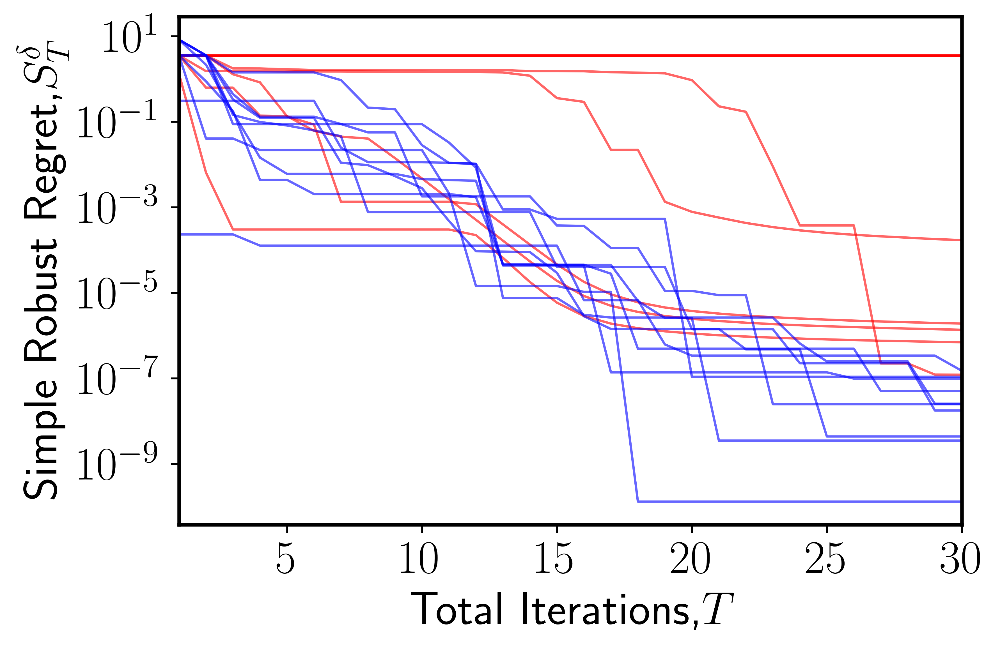

In [32]:
lw=1
plt.figure(dpi=600)
for i in range(n_repeats):
    plt.semilogy(range(1,31),regrets_mean[i],'r-',alpha=0.6,linewidth=lw)
    
for i in range(n_repeats):
    plt.semilogy(range(1,31),regrets_arbo[i],'b-',alpha=0.6,linewidth=lw)

plt.xlim([1,30])
plt.xlabel('Total Iterations,' + r'$T$',fontsize=20)
plt.ylabel('Simple Robust Regret,'+ r'$S_T^{\delta}$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
    

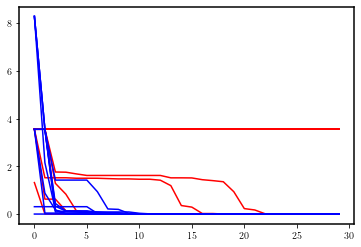

In [33]:
for i in range(n_repeats):
    plt.plot(regrets_mean[i],'r-')
    
for i in range(n_repeats):
    plt.plot(regrets_arbo[i],'b-')

In [34]:
xopt_arbo

[-0.35724013232377005,
 -0.3570845888592318,
 -0.3573278326473188,
 -0.3575205792341934,
 -0.3572850459522248,
 -0.35762256302512785,
 -0.35745678688074634,
 -0.35751116066667127,
 -0.35755550925461693,
 -0.3572252913333845]

(array([-2.,  0.,  2.,  4.,  6.,  8., 10.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

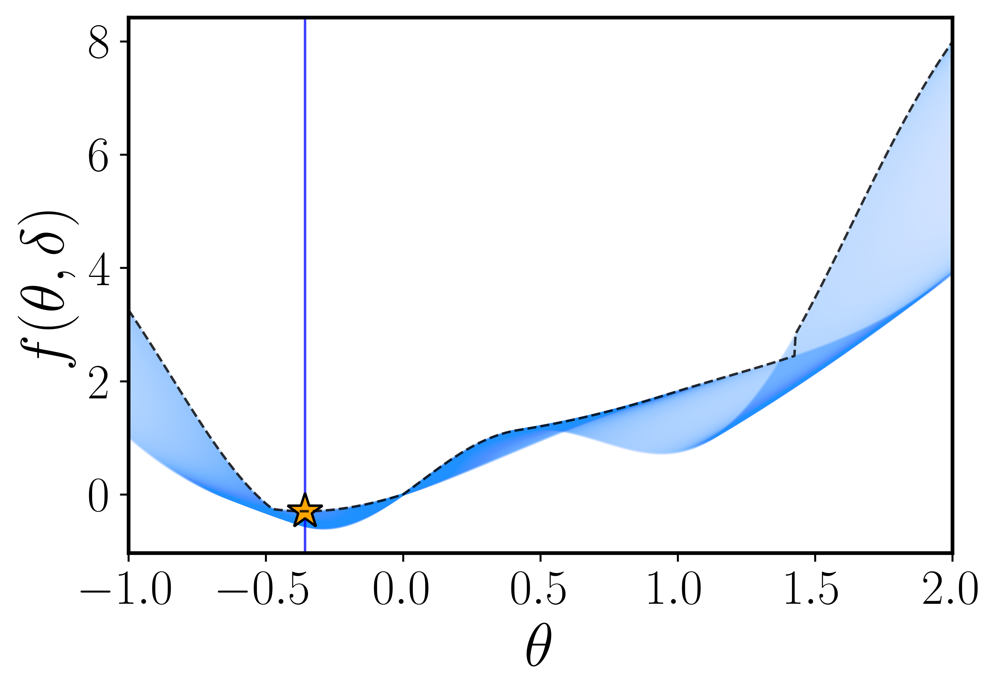

In [35]:
theta_final = np.linspace(2.0,4.0,1000)
# colors = ['r','b','g']
plt.figure(dpi=600)
for j in range(len(theta_final)):
    nvis=1000
    Z_vis=np.zeros((nvis,2))
    Z_vis[:,0]=np.random.uniform(-1.0,2,nvis)
    Z_vis[:,0]=np.sort(Z_vis[:,0])
    Z_vis[:,1]=np.random.uniform(theta_final[j],theta_final[j],nvis)
    Y_vis=np.zeros((nvis,1))
    for k in range(nvis): 
        Y_vis[k]=f(Z_vis[k,:])

    #Z_init_nom = Z_init[:,0]
    plt.plot(Z_vis[:,0],Y_vis,'-',label=r'$\delta=$ %s' % theta_final[j], linewidth=1, color='dodgerblue',alpha=0.01)


plt.axvline(x=np.mean(xopt_arbo),linestyle='-',linewidth=1, color='b',alpha=0.75)
plt.xlim([-1,2])
plt.xlabel(r'$\theta$',fontsize=15)
plt.ylabel(r'$f(\theta,\delta)$',fontsize=15)
plt.plot(opti_full.x,opti_full.f,'k*',markersize=15, markeredgecolor='k',markerfacecolor='orange')

plt.plot(x_arr,function_values_plot,'k--',linewidth=1,alpha=0.8)
plt.xlabel( r'$\theta$',fontsize=25)
plt.ylabel(r'$f(\theta,\delta)$',fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
    

   # plt.axvline(x=np.mean(xopt_mean),linewidth=1, color='b')

In [36]:
bo_iters = 30 
avg_arbo_reg=np.zeros((bo_iters,1))
for j in range(bo_iters):
    temp = 0.0 
    for i in range(n_repeats):
        temp += regrets_arbo[i][j]
    avg_arbo_reg[j] = temp/n_repeats

In [37]:
avg_mean_reg=np.zeros((bo_iters,1))
for j in range(bo_iters):
    temp = 0.0 
    for i in range(n_repeats):
        temp += regrets_mean[i][j]
    avg_mean_reg[j] = temp/n_repeats

In [38]:
bo_iters = 30 
arbo_matrix = np.zeros((n_repeats,bo_iters))
for j in range(bo_iters):
    for i in range(n_repeats):
        arbo_matrix[i][j]=regrets_arbo[i][j]


In [39]:
bo_iters = 30 
mbo_matrix = np.zeros((n_repeats,bo_iters))
for j in range(bo_iters):
    for i in range(n_repeats):
        mbo_matrix[i][j]=regrets_mean[i][j]


In [40]:
arbo_average = np.zeros((bo_iters,1))
mbo_average = np.zeros((bo_iters,1))

arbo_confidence=np.zeros((bo_iters,1))
mbo_confidence=np.zeros((bo_iters,1))

In [41]:
tau = 1.812
for j in range(bo_iters):
    arbo_average[j] = np.mean(arbo_matrix[:,j])
    arbo_std = np.sqrt(np.var(arbo_matrix[:,j]))
    arbo_confidence[j] = tau*arbo_std/n_repeats
    
for j in range(bo_iters):
    mbo_average[j] = np.mean(mbo_matrix[:,j])
    mbo_std = np.sqrt(np.var(mbo_matrix[:,j]))
    mbo_confidence[j] = tau*mbo_std/n_repeats

In [42]:
plt.rcParams.update({
    'text.latex.preamble': r'\usepackage{amsfonts}'
})

In [43]:
arbo_minus = arbo_average-arbo_confidence
arbo_plus = arbo_average+arbo_confidence

mbo_minus = mbo_average-mbo_confidence
mbo_plus = mbo_average+mbo_confidence

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.,  6.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

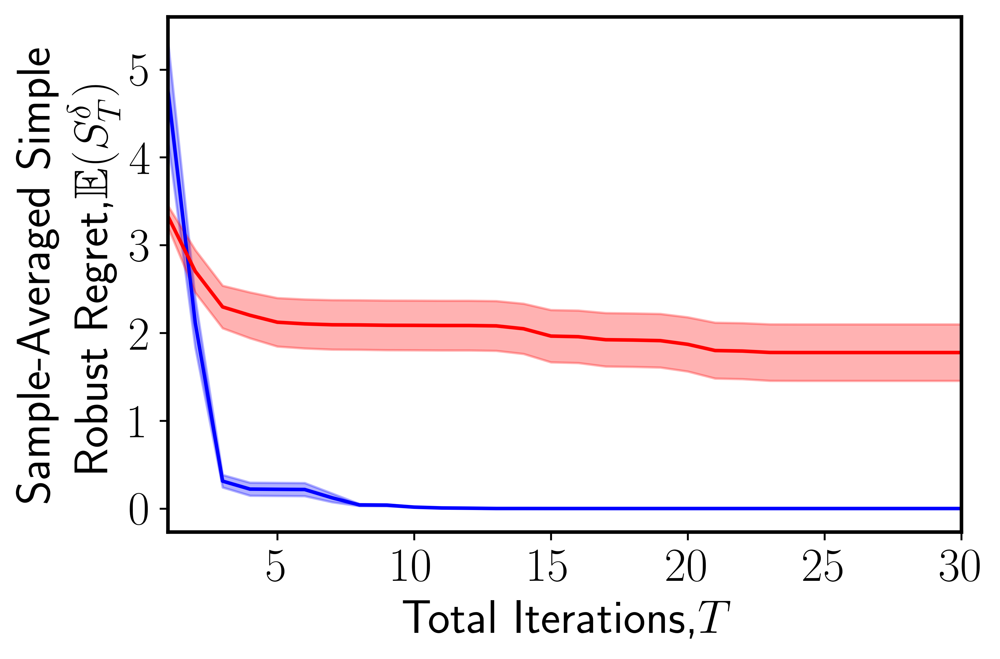

In [44]:
plt.figure(dpi=600)
plt.plot(1+np.arange(bo_iters),arbo_average, color='b',label='ARBO')
plt.plot(1+np.arange(bo_iters),mbo_average, color='r', label = 'MBO')

plt.fill_between(1+np.arange(bo_iters),arbo_minus.reshape(bo_iters,), arbo_plus.reshape(bo_iters,), alpha=0.3,color='b')
plt.fill_between(1+np.arange(bo_iters),mbo_minus.reshape(bo_iters,), mbo_plus.reshape(bo_iters,), alpha=0.3,color='r')
#plt.legend()
plt.xlim([1,bo_iters])
plt.xlabel('Total Iterations,' + r'$T$',fontsize=20)
plt.ylabel('Sample-Averaged Simple \n Robust Regret,'+ r'$\mathbb{E}(S_T^{\delta})$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

In [45]:
arbo_matrix[:,0]

array([8.28548042e+00, 3.55292467e+00, 3.55292467e+00, 8.28548042e+00,
       3.55292467e+00, 3.08739542e-01, 8.28548042e+00, 8.28548042e+00,
       2.31743112e-04, 3.55292467e+00])

## Contour Plots

GP_regression.,value,constraints,priors
Mat32.variance,0.9609730213758446,+ve,
Mat32.lengthscale,0.8386068393563453,+ve,
Gaussian_noise.variance,1.0000000002156503e-10,+ve,


Entering iteration: 0
Current iteration beta is: 0.13862943611198905
At the queried point [-1.] [4.] the function attains a value of [3.2568025]
Trained new model with 4 samples
The current best point is  -0.9999999999999998
Entering iteration: 1
Current iteration beta is: 0.21972245773362198
At the queried point [2.] [2.70885939] the function attains a value of [4.82204737]
Trained new model with 5 samples
0
The current best point is  -0.9999999999999998
Entering iteration: 2
Current iteration beta is: 0.2772588722239781
At the queried point [0.43345538] [4.] the function attains a value of [1.14578024]
Trained new model with 6 samples
2
The current best point is  0.4334553751697686
Entering iteration: 3
Current iteration beta is: 0.3218875824868201
At the queried point [0.62659366] [2.] the function attains a value of [1.19193598]
Trained new model with 7 samples
2
The current best point is  0.4334553751697686
Entering iteration: 4
Current iteration beta is: 0.358351893845611
At the 

 /var/folders/h4/q_48njcs10v433r5bmm1t3l00000gn/T/ipykernel_69938/1870139441.py:121: RuntimeWarning:More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Entering iteration: 21
Current iteration beta is: 0.62709884318583
At the queried point [-0.36446693] [2.27359018] the function attains a value of [-0.35448906]
Trained new model with 25 samples
17
The current best point is  -0.3078867636402646
Entering iteration: 22
Current iteration beta is: 0.6356107660695892
At the queried point [-0.36440458] [2.] the function attains a value of [-0.29598508]
Trained new model with 26 samples
22
The current best point is  -0.36440457620257743
Entering iteration: 23
Current iteration beta is: 0.6437751649736402
At the queried point [-0.34182546] [2.] the function attains a value of [-0.29547167]
Trained new model with 27 samples
22
The current best point is  -0.36440457620257743
Entering iteration: 24
Current iteration beta is: 0.6516193076042964
At the queried point [-0.38381896] [2.] the function attains a value of [-0.29419036]
Trained new model with 28 samples
22
The current best point is  -0.36440457620257743
Entering iteration: 25
Current iter

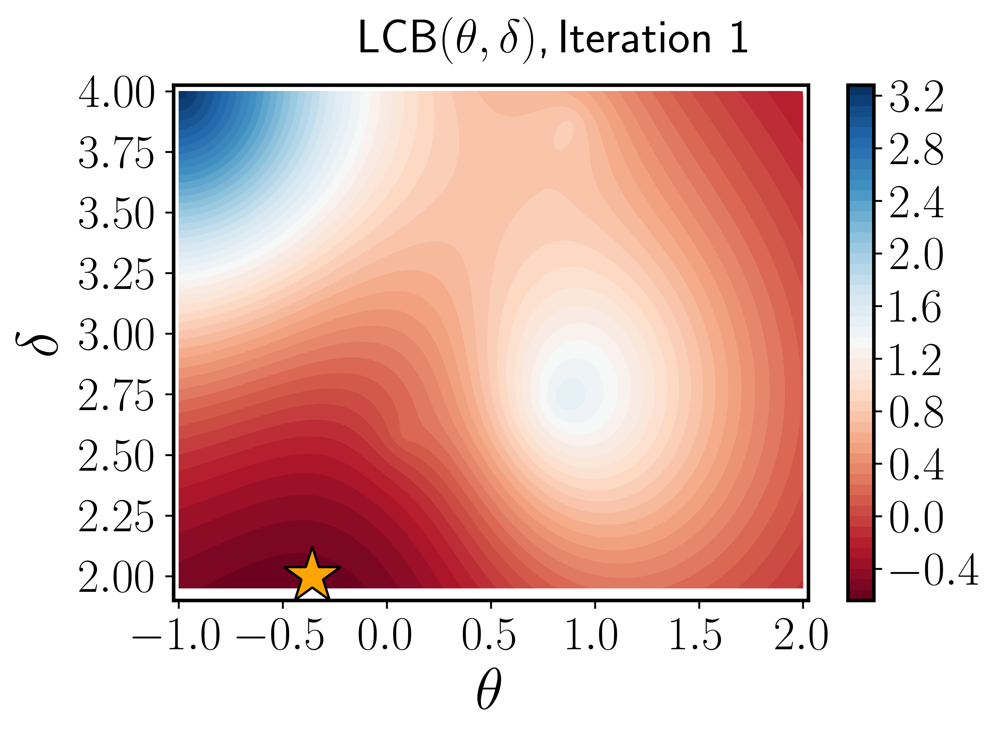

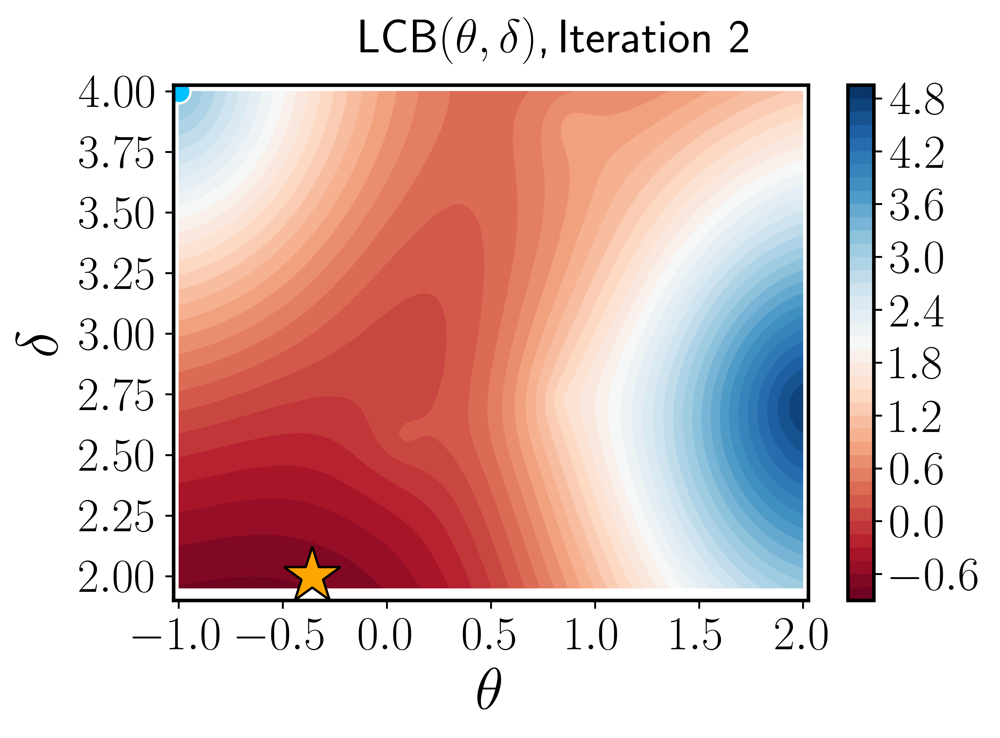

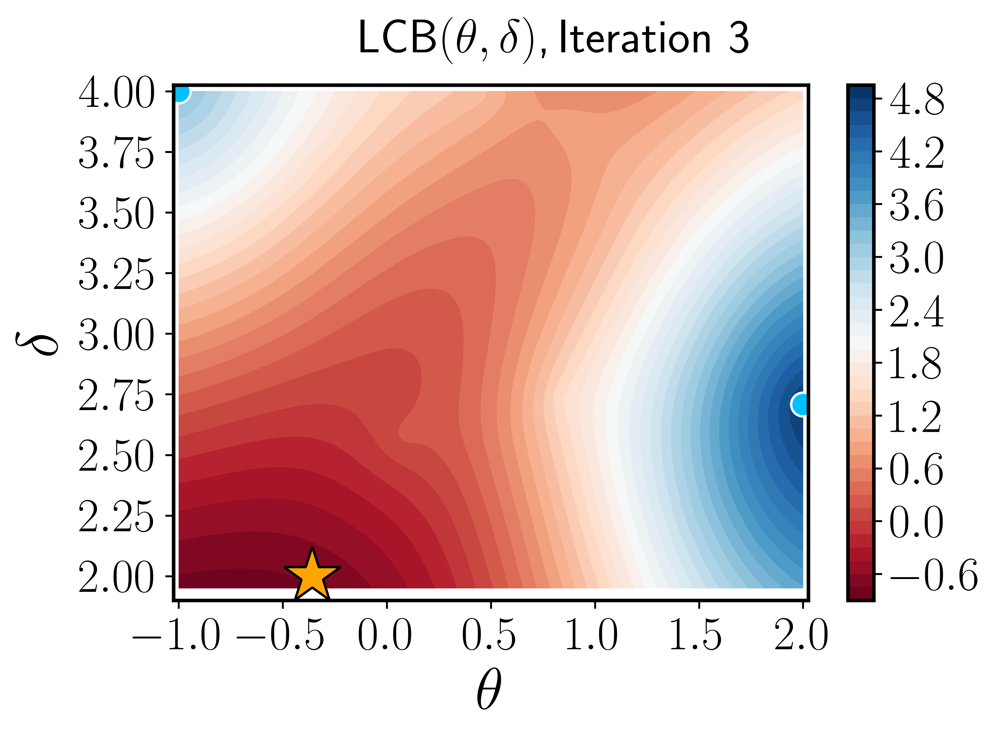

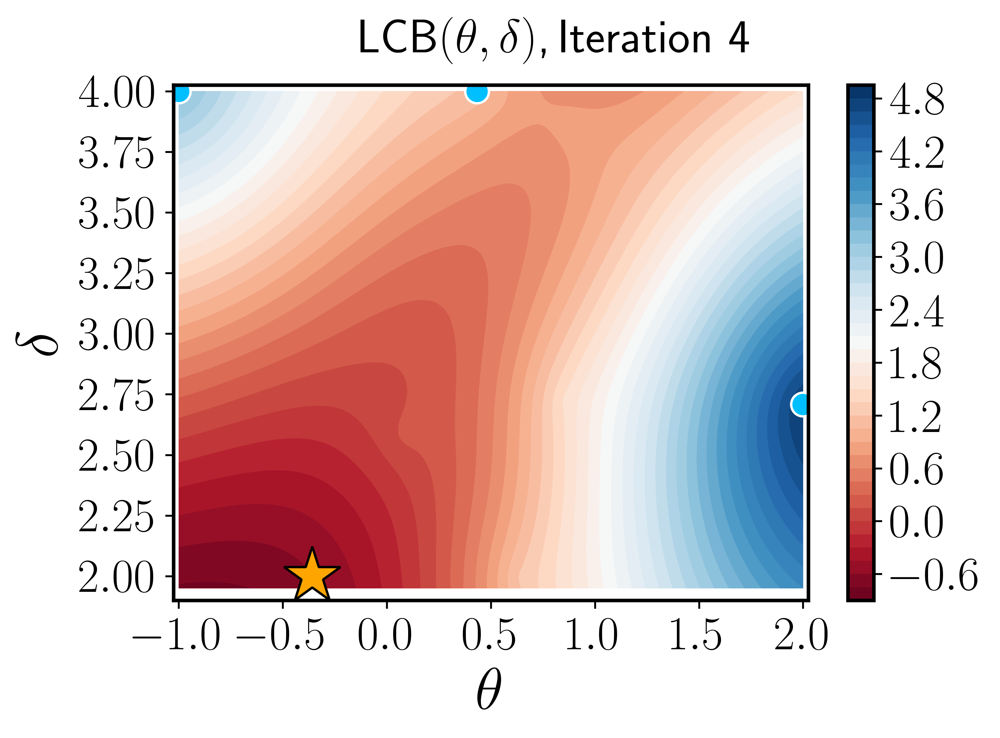

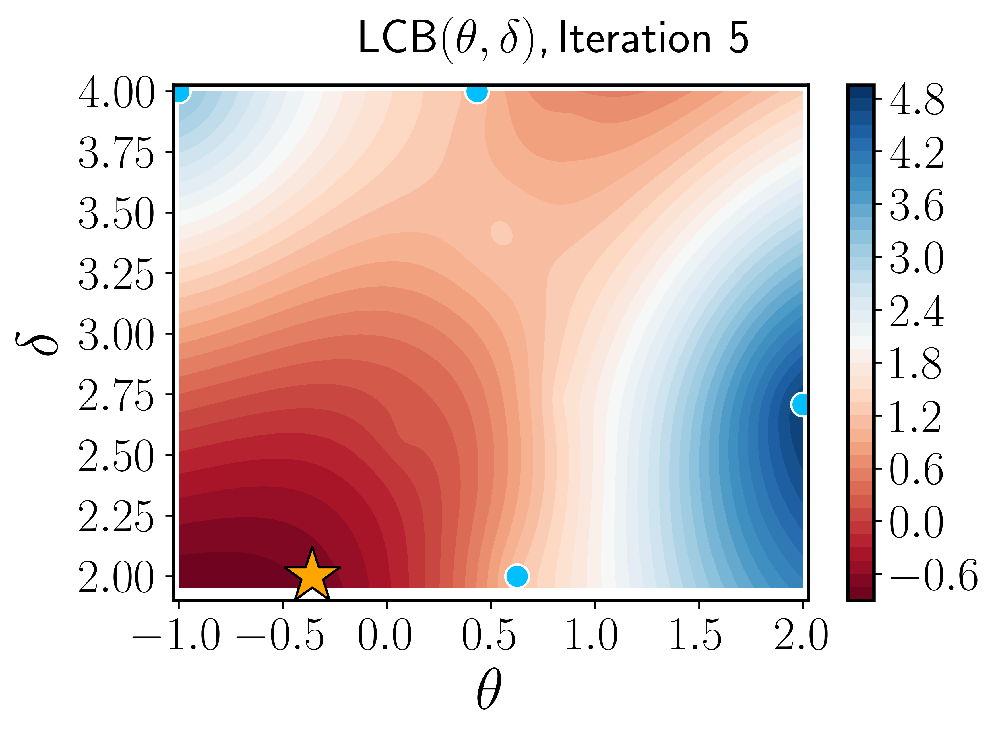

...

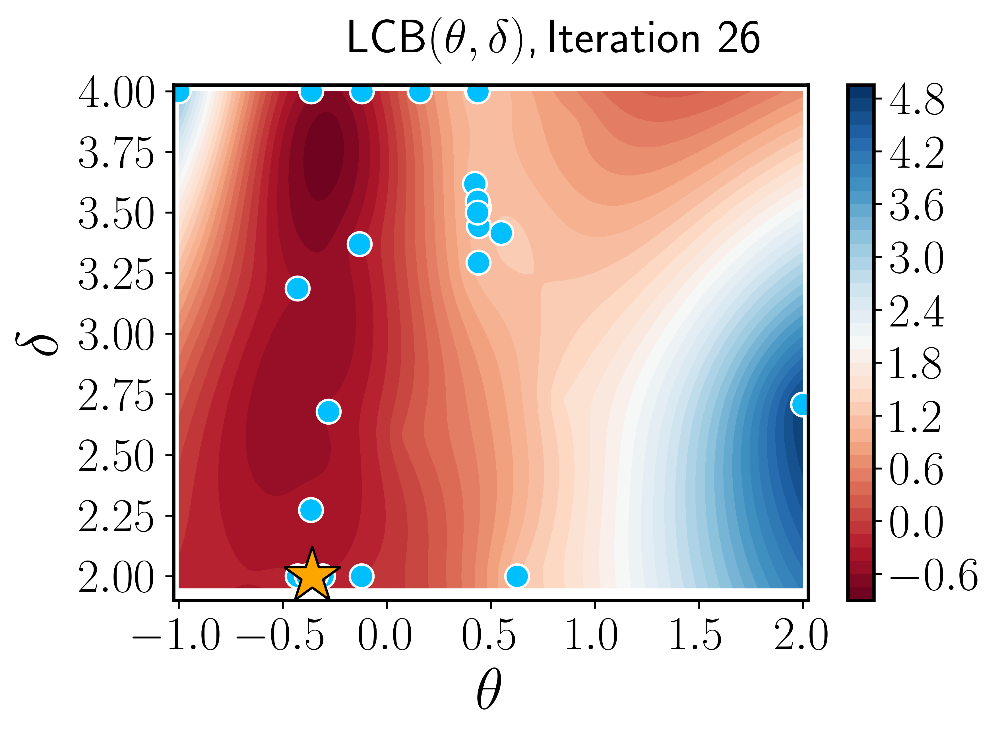

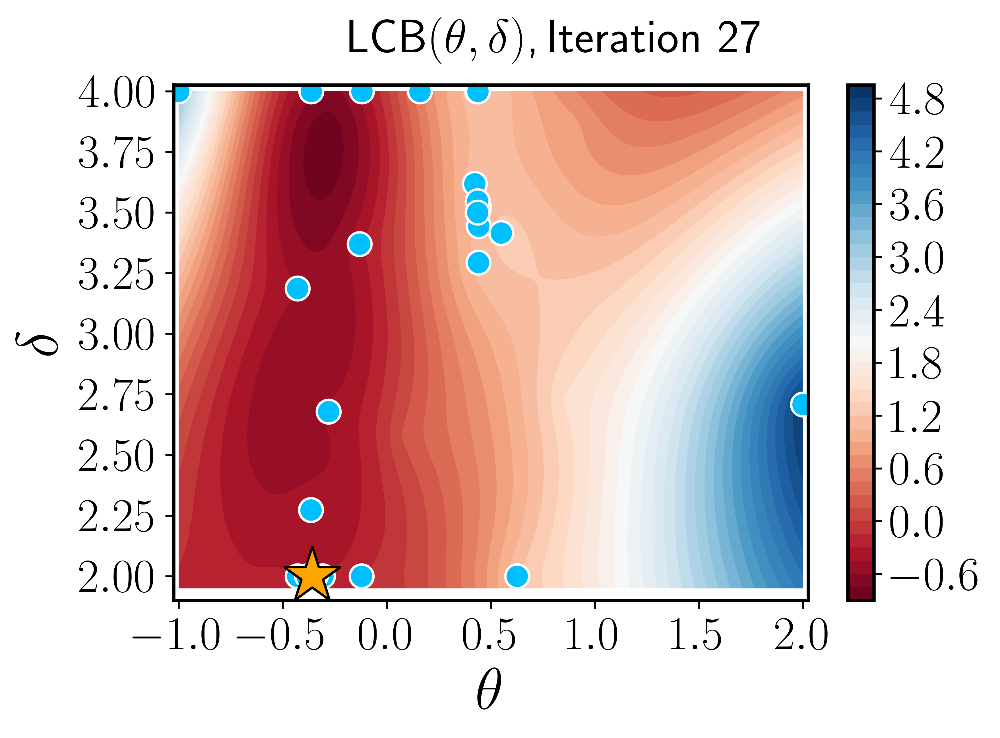

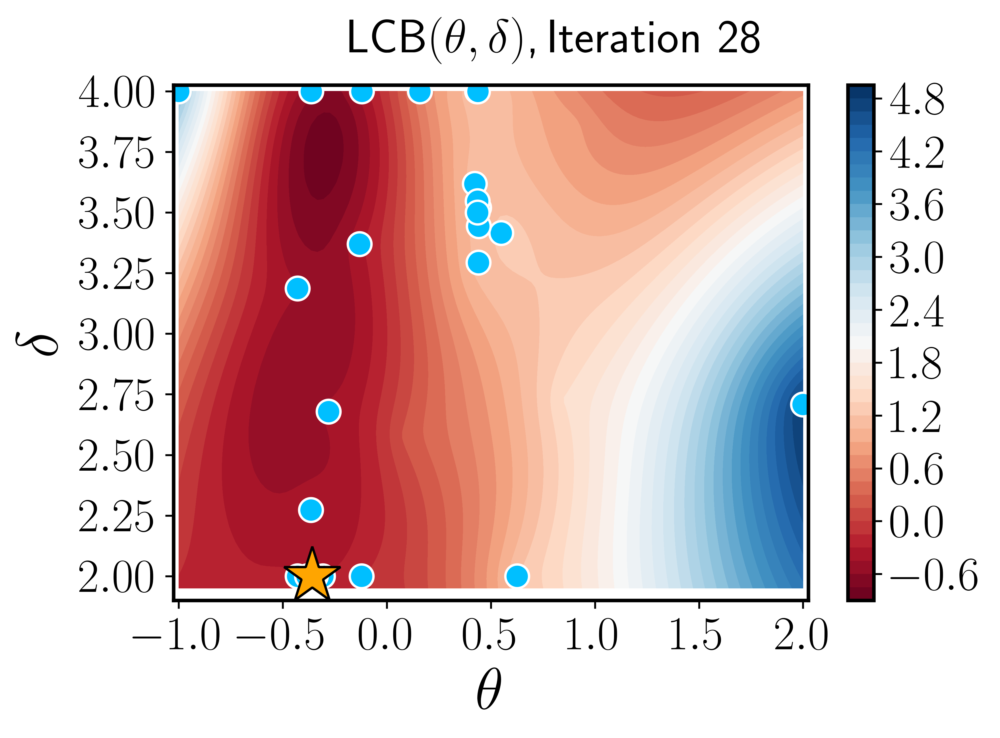

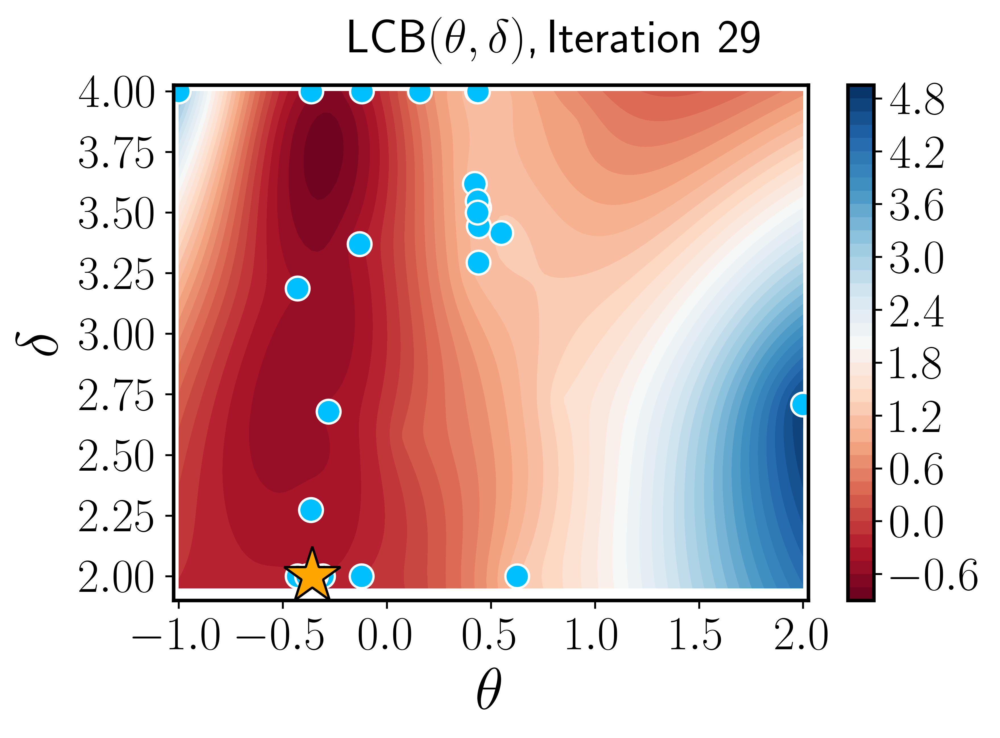

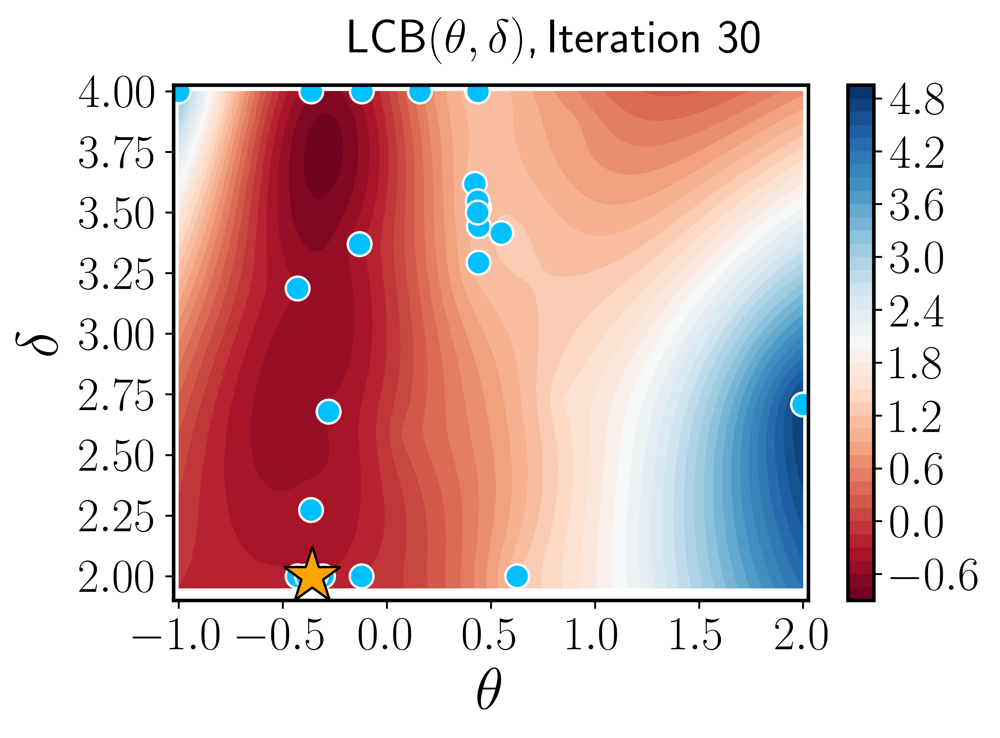

In [46]:
mode='arbo'
gpr=[]
gpr_initial=[]
model_c = []
x_queried =[]
theta_queried=[]
kernelf=[]

random.seed(datetime.now())
noise=1e-5

bounds_th =np.array((2.0,4.0));bounds_x =np.array((-1.0,2.0))

ninit=3
Z_init=np.zeros((ninit,2))
Z_init[:,0]=np.random.uniform(bounds_x[0],bounds_x[1],ninit)
Z_init[:,1]=np.random.uniform(bounds_th[0],bounds_th[1],ninit)
#Z_init[:,0]=np.linspace(bounds_x[0],bounds_x[1],ninit)
#Z_init[:,1]=np.linspace(bounds_th[0],bounds_th[1],ninit)


# Initialize samples
Y_init = np.zeros((ninit,1))
for j in range(ninit):
    Y_init[j] = f(Z_init[j])

#rbf = GPy.kern.RBF(input_dim=2,ARD=False)
kernelf = GPy.kern.Matern32(input_dim=2)
gpr_initial = GPy.models.GPRegression(Z_init, Y_init, kernelf)
gpr_initial.Gaussian_noise.variance = noise**2
#gpr.Gaussian_noise.variance.fix()
# Run optimization
gpr_initial.optimize();

# Display optimized parameter values
display(gpr_initial)

#Define the BO parameters

#beta=0.2*(1+1)*np.log(2*(1+1)) #bounds_th =np.array((2.0,4.0));bounds_x =np.array((-1.0,2.0))
niter=30
Z_sample = Z_init
Y_sample = Y_init
model_c = gpr_initial
z_sequence = []
smallest_ucb = []
srr = [] 

x_sequence = np.zeros((niter,))
th_sequence = np.zeros((niter,))

x_recomm = np.zeros((niter,))
th_recomm = np.zeros((niter,))

#Remember to re-load kernel to erase the GP 
for j in range(niter):
    if mode=='arbo':
        beta = 0.1*2*np.log(2+j)
    elif mode=='mean':
        beta=0.0

    print('Entering iteration:', j)
    print('Current iteration beta is:' ,beta)
    #Find next best point to query
    x_t,theta_t = joint_location_propose(beta,model_c,bounds_th,bounds_x)
    #print(x_t,theta_t)
    Z_add=np.array([x_t,theta_t]).T
    z_sequence.append(Z_add)
    
    x_sequence[j] = x_t
    th_sequence[j] = theta_t

    Y_add=f(Z_add.T)
    print('At the queried point', x_t,theta_t,'the function attains a value of', Y_add)

    #Add to dataset
    Z_sample = np.concatenate((Z_sample,Z_add))
    Y_sample = np.concatenate((Y_sample,Y_add.reshape(1,1)))
    #Update GP Model
    gpr = GPy.models.GPRegression(Z_sample, Y_sample, kernelf)
    # Fix the noise variance to known value 
    gpr.Gaussian_noise.variance = noise**2
    # Run optimization
    gpr.optimize(messages=False);
    model_c = gpr
    print('Trained new model with', len(model_c.X), 'samples')
    
    #Recommend a point here! (internally in the loop -- everytime it will look all x_t in the past not the previous 

    xbest, thbest, sucb = recommend_optimum_modified( z_sequence,beta,bounds_th,gpr)
    
    x_recomm[j] = xbest
    th_recomm[j] = thbest

   # thetas=np.linspace(2.0,4.0,3)
   # plt.figure(dpi=100)
   # for j in range(len(thetas)):
    #    visualize_1D(thetas[j])
    #plt.plot(opti_full.x,opti_full.f,'ro',markersize=5)
    #plt.axvline(x=xbest)

    smallest_ucb.append(sucb)

    srr.append(discrete_optimal_regret(z_sequence,bounds_th) - opti_full.f)

    print("The current best point is ", xbest)
    
    #<><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><>
    #Iteration Plots
    #Contour Plots
    npoints = 100
    xplt = np.linspace(-1.0, 2.0, npoints)
    tplt = np.linspace(1.95, 4.0, npoints)
    Xm, Tm = np.meshgrid(xplt, tplt)
    Z = - (-np.sin(Tm*Xm) - np.sqrt(Tm)*Xm**2 + 0.5*Xm )
    Z_mu = Z*0.0
    for i_c in range(100):
        for j_c in range(100):
            Z_mu[i_c,j_c] = lower_confidence_bound(Tm[i_c,j_c],Xm[i_c,j_c],beta,gpr)

    plt.figure(dpi=600)
    plt.contourf(Xm, Tm, Z_mu, 50, cmap='RdBu')
    plt.plot(x_sequence[0:j],th_sequence[0:j],'o',markersize=10,markeredgecolor='white',
            markerfacecolor='deepskyblue', linewidth=1)

    plt.plot(opti_full.x,opti_theta,'b*',markersize=25,markeredgecolor='black',markerfacecolor='orange')

    cbar = plt.colorbar()
    ticklabs = cbar.ax.get_yticklabels()
    cbar.ax.set_yticklabels(ticklabs, fontsize=20)
  #  plt.colorbar(fontsize=20)
    plt.xlabel(r'$\theta$',fontsize=25)
    plt.ylabel(r'$\delta$',fontsize=25)
    plt.ylim([1.9,4.025])
    plt.xlim([-1.025,2.025])
    plt.suptitle('LCB'+r'$(\theta,\delta)$,\,''Iteration %d' %(j+1) , fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    
    """
    plt.figure(dpi=300)
    plt.contourf(Xm, Tm, np.abs(Z-Z_mu), 50, cmap='GnBu')
    plt.plot(x_recomm[0:j],th_recomm[0:j],'ko',markersize=10,markeredgecolor='white' )
    plt.plot(opti_full.x,opti_theta,'k*',markersize=20,markerfacecolor='k',markeredgecolor='white')
    plt.colorbar(fontsize=20)
    plt.xlabel(r'$\theta$',fontsize=25)
    plt.ylabel(r'$\delta$',fontsize=25)
    plt.ylim([1.95,4.05])
    plt.xlim([-1.05,2.05])
    plt.suptitle('Iteration %d' %(j+1) , fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    """


Text(0.5, 0.98, 'Absolure error of GP approximation and$f(\\theta,\\delta)$ ')

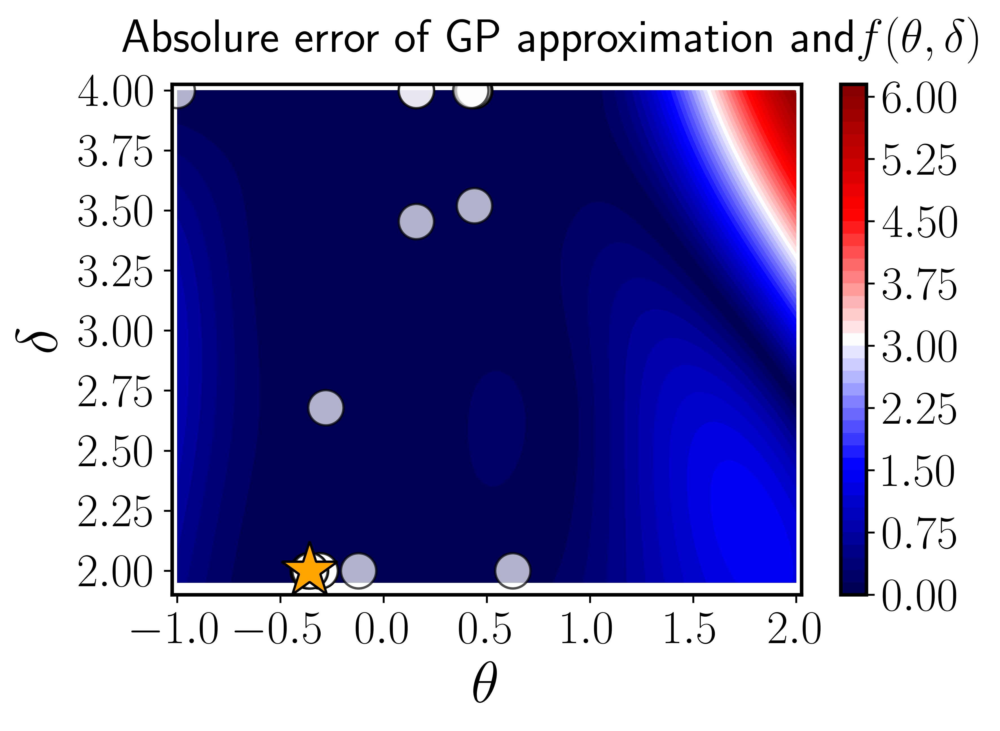

In [50]:
#<><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><><>
#Iteration Plots
#Contour Plots
jrep = 30 
npoints = 100
xplt = np.linspace(-1.0, 2.0, npoints)
tplt = np.linspace(1.95, 4.0, npoints)
Xm, Tm = np.meshgrid(xplt, tplt)
Z = - (-np.sin(Tm*Xm) - np.sqrt(Tm)*Xm**2 + 0.5*Xm )
Z_mu = Z*0.0
for i_c in range(100):
    for j_c in range(100):
        Z_mu[i_c,j_c] = lower_confidence_bound(Tm[i_c,j_c],Xm[i_c,j_c],0.0,gpr)

plt.figure(dpi=600)
plt.contourf(Xm, Tm, abs(Z-Z_mu), 50, cmap='seismic')
plt.plot(x_recomm[1:jrep],th_recomm[1:jrep],'o',markersize=15,markeredgecolor='black',alpha=0.7,
         markerfacecolor='w',color='w' ,linewidth=1)
plt.plot(opti_full.x,opti_theta,'b*',markersize=25,markeredgecolor='black',markerfacecolor='orange')
cbar = plt.colorbar()
ticklabs = cbar.ax.get_yticklabels()
cbar.ax.set_yticklabels(ticklabs, fontsize=20)
plt.xlabel(r'$\theta$',fontsize=25)
plt.ylabel(r'$\delta$',fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim([1.9,4.025])
plt.xlim([-1.025,2.025])
plt.suptitle('Absolure error of GP approximation and' +  r'$f(\theta,\delta)$ ', fontsize=20)


In [ ]:
x_recomm

In [ ]:
th_recomm
